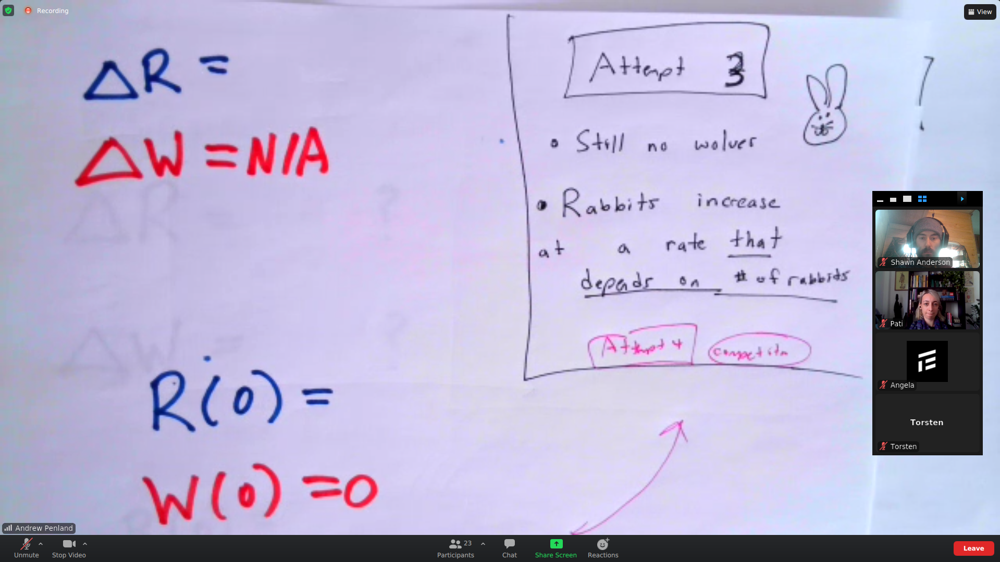

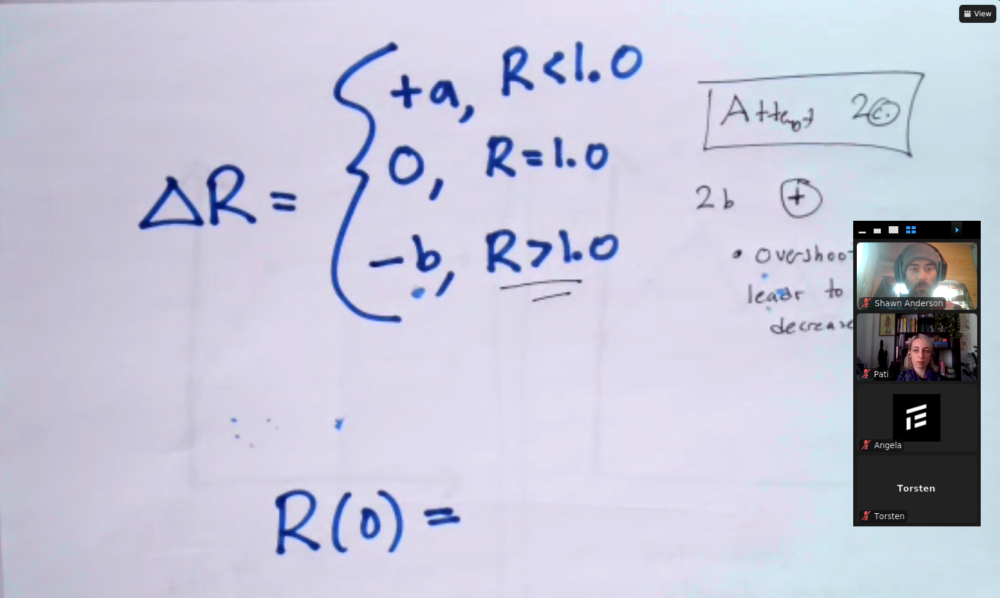

In [1]:
import math
import pandas as pd
import numpy as np
import plotly
import hvplot.pandas


pd.options.plotting.backend = "plotly"

from cadCAD.configuration.utils import config_sim

from cadCAD.engine import ExecutionMode, ExecutionContext
from cadCAD.engine import Executor

from cadCAD.configuration import Experiment
from cadCAD import configs

In [2]:
SIMULATION_TIMESTEPS = 20

initial_state = {
    'rabbits': 0.1,
}

system_params = {
    'increase': [0.1],
    'decrease': [-0.05],
}

In [3]:
def p_growth(params, substep, state_history, previous_state):
    R = previous_state['rabbits']
    a = params['increase']
    b = params['decrease']
    if R < 1:
        delta_R = a
    elif R-1 < 0.001:
        delta_R = 0
    elif R > 1:
        delta_R = b
    else:
        raise Exception("Should never reach here.") 
        
    return {'delta_R': delta_R}

In [4]:
def s_rabbits(params, substep, state_history, previous_state, policy_input):
    rabbits = previous_state['rabbits'] + policy_input['delta_R'] 
    return 'rabbits', max(rabbits, 0)

In [5]:
partial_state_update_blocks = [
    {
        'policies': {
            'p_growth': p_growth,
        },
        'variables': {
            'rabbits': s_rabbits,
        }
    }
]

In [6]:
sim_config = config_sim({
    'N': 1,
    'T': range(SIMULATION_TIMESTEPS),
    'M': system_params
})
del configs[:] # Clear any prior configs
experiment = Experiment()
experiment.append_configs(
    initial_state = initial_state,
    partial_state_update_blocks = partial_state_update_blocks,
    sim_configs = sim_config,
)

exec_mode = ExecutionMode()
exec_context = ExecutionContext()

In [7]:
simulation = Executor(exec_context=exec_context, configs=configs)
raw_result, tensor_field, sessions = simulation.execute()


                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 1
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (20, 2, 1, 1)
Execution Method: local_simulations
SimIDs   : [0]
SubsetIDs: [0]
Ns       : [0]
ExpIDs   : [0]
Execution Mode: single_threaded
Total execution time: 0.01s


In [8]:
simulation_result = pd.DataFrame(raw_result)#.set_index('timestep')
simulation_result

,rabbits,simulation,subset,run,substep,timestep
0,0.10,0,0,1,0,0
1,0.20,0,0,1,1,1
2,0.30,0,0,1,1,2
3,0.40,0,0,1,1,3
4,0.50,0,0,1,1,4
5,0.60,0,0,1,1,5
6,0.70,0,0,1,1,6
7,0.80,0,0,1,1,7
8,0.90,0,0,1,1,8
9,1.00,0,0,1,1,9


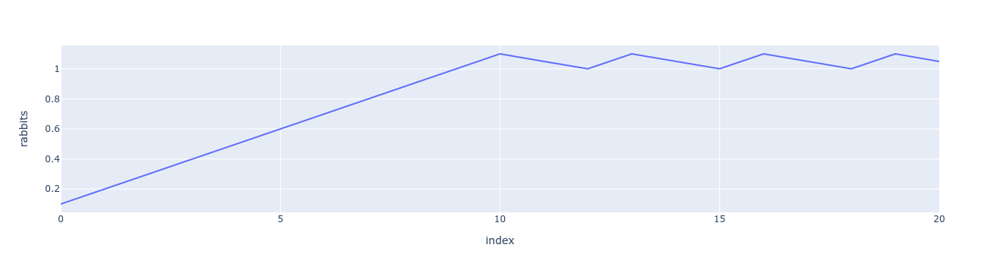

In [9]:
simulation_result.plot(y='rabbits')